# Свёрточные сети

Сегодня мы детальнее поговорим про общие подходы при обучении нейросетей, и что происходит внутри них.

<img width='400px' src='https://raw.githubusercontent.com/sslotin/universum-dl/43390d26d5f256dcc68a6ba51998bd626b3f6d33/images/cat.png'>

Если попытаться визуализировать то, что выучивает каждый нейрон в нейросети (например, посмотрев, какие входные пиксели на него сильнее всего влияют), то можно увидеть, что чем глубже находится слой, тем более абстрактные фичи он содержит.

Например, в сетях для распознавания картинок первые слои учатся обнаруживать геометрические примитивы: линии, границы, углы. Следующий слой может распознавать простые геометрические фигуры. Следующий распознаёт наличие целых объектов и т. д.

**Weight sharing**. [Эксперименты с дропаутом](https://arxiv.org/abs/1701.05369) показывают, что в линейном слое примерно 99% весов на самом деле можно выкинуть. Логично, что в оптимальной архитектуре не должно быть бесполезных весов — лишние параметры всегда ведут к переобучению. В случае с картинками решение в том, чтобы использовать информацию о расположении пикселей относительно друг друга.

## Свёртки и пуллинги

**Как хранятся картинки**. Когда говорят «изображение», представляйте не прямоугольник, а параллелепипед, высотой которого будет размер каналов. Например, обычные цветные RGB картинки имеют 3 канала: на красный (R), зелёный (G) и синий (B).

0. Введем такую функцию, как **ядро** (англ. **kernel**) — она считает скалярное произведение вектора-входа со своим вектором-параметром.
1. Разобьем исходный паралеллелепипед на сколько-то параллелепипедов одинакового размера вдоль размерности, соответствующей каналам. Они могут пересекаться.
2. Каждый из них «разгладим» в вектор.
3. К кажому такому вектору и применим по очереди каждый кернел (их обычно берут много разных).
4. Положим то, что получилось, в новый параллелепипед.
5. Посчитаем для кажой ячейки какую-нибудь нелинейность. Обычно это ReLU из-за вычислительных причин.

<img width='350px' src='https://raw.githubusercontent.com/sslotin/universum-dl/43390d26d5f256dcc68a6ba51998bd626b3f6d33/images/conv1.png'>

Эта операция называется **свёрткой**. Помимо кернела, в ней есть другие параметры — паддинг (отступ по краям), страйды (шаги по x и y). Также свёртка может быть в 2d и 3d. Посмотрите этот репозиторий, чтобы получше разобраться со свёрточной арифметикой: https://github.com/vdumoulin/conv_arithmetic

![](http://deeplearning.net/software/theano/_images/numerical_padding_strides.gif)

**Пулингом** называют операцию, при которой входной тензор так же разбивается на квадраты (не паралепипеды — операция независима по каждому каналу) и на каждом квадрате считается какая-нибудь редукция (чаще всего максимум или среднее по всем значениям в квадрате), после чего полученные значения записываются на следующий слой в том же порядке.

<img width='400px' src='http://cs231n.github.io/assets/cnn/maxpool.jpeg'>

В свёртках переиспользуется очень много параметров: кернел для каждого фильтра (выходного канала) использует один и тот же вектор-параметр для скалярного умножения. Из-за этого каждый фильтр как правило выучивает какую-то конкретную фичу, вроде наличия какого-либо объекта на своём регионе. Пулинг используют затем для понижения размерности: каждый нейрон после свертки выражает степень уверенности, что на регионе присутствует какой-то объект, и поэтому логично в качестве вероятности наличия объекта на регионе из под-регионов использовать максимум или среднее.

Чаще всего используют свёртки 3x3 со страйдом 2x2 (то есть квадраты перекрываются по 3 крайним пикселям) с пулингом размера 2x2 (не перекрываются).

## Аугментация данных

Аугментацией называется процесс получения новых синтетических данных из имеющихся, чтобы подать в обучение. Это часто (особенно в компьютерном зрении) позволяет улучшить качество модели, не используя дополнительных данных.

Формально, в случае с классификацией, аугментация — это любое преобразование, которое корректно изменяет данные, не меняя их класс.

В случае с картинками, можно попробовать добавить следующие преобразования, которые с какой-то вероятностью будут использоваться во время обучения:

* Поворот на малый угол.
* Добавление шума.
* Обрезание границ и последующее растяжение до исходного размера.
* Горизонтальное отражение (но в нашем случае оно вредно).
* Смещение на небольшое расстояние.

Понятно, что лейбл эти преобразования изменить не должны.

<img src='https://ai2-s2-public.s3.amazonaws.com/figures/2017-08-08/a5da2c3b4174449d13dd746b7d00897c6bc1f334/5-Figure2-1.png' width='500px'>

## Взрывающийся градиент

В сетях происходит очень много чего стохастического: батч формируется случайно, аугментация, рандомизированные слои вроде дропаута, вычислительные ошибки. Это всё может привести к тому, что сеть на какой-то итерации будет очень уверенна в неправильном предсказании и некоторые её параметры получат очень большой градиент. Это может привести к тому, что эти параметры «улетят» куда-то настолько далеко, и после этого сеть будет всегда предсказывать класс, который на этой итерации был правильным. 

Простое решение: просто обрезать градиент в случае, если градиент больше какого-то фиксированного значения. Для этого есть функция `torch.nn.utils.clip_grad_norm_`, которая принимает параметры модели и параметр `threshold`. Она считает норму (длину вектора) градиента и, если она больше `threshold`, нормирует градиенты так, чтобы она была равна `threshold`. Эта функция также возвращает само значение нормы, что может быть очень полезно при анализе обучения (например, если она становится маленькой, то, значит, сеть сходится к какому-то плато).

## Инициализация параметров

Сначала приведем пример плохой инициализации. Пусть мы задали все значения изначально нулями. В таком случае наша модель становится эквивалентна линейной модели — производная по функции потерь одинакова для каждого $w_i$, таким образом, все веса имеют одинаковые значения и в последующей итерации, что делает нейроны в сети симметричными.

Подход получше — инициализировать каждый вес случайно. Но тут нужно быть осторожным — если задать их слишком большими, то сеть может быть изначально очень уверенна в своих предсказаниях, и подвинуть параметры оттуда будет очень трудно.

Решение следующее. С точки зрения слоя, ему на вход подается сэмпл из какого-то распределения, и он под это распределение подстраивается. В нейросетях размеры слоев достаточно большие, чтобы в них работали законы статистики, все разработчики фреймворках условились инициализировать веса всех слоев в предположении, что на вход подаются данные из какого-то распределения со средним 0 и дисперсией 1, и на выходе должно получиться какое-то распределение со средним тоже 0 и дисперсией 1. Чаще всего изначальные веса берут либо из нормального, либо из равномерного распределения, «обрезанного» так, чтобы дисперсия каждого выходного значения получилась единичной.

Аналогично нужно поступать со входными векторными данными: нормализовывать. Это будет важно при работе с изображениями: не надо подавать на вход вектора с элементами от 0 до 255. Самое простое рабочее решение — нормализовать вход, поделив его на 255.

## Минутка физики

Потребляемая энергия в сети с переменным током в единицу времени считается по формуле

$$W = CV^2f$$

где $C$ означает емкость сети, $V$ означает напряжение, а $f$ — частоту. В случае с процессорами, это именно та частота, с которой выполняются элементарные операции, например сложение.

<img width='350px' src='https://i.ibb.co/yhsGRJK/Screenshot-from-2019-02-08-14-52-07.png'>

Однако, если мы сделаем сеть из двух параллельно подключенных процессоров, работающих на половинной частоте, мы можем получить сеть, потребляющую ~40% изначальной энергии, делающую то же количество полезной работы — то же суммарное количество процессорных тактов:

<img width='450px' src='https://i.ibb.co/WgLCxxL/Screenshot-from-2019-02-08-14-52-18.png'>

Поэтому для хорошо распараллеливаемых операций используют другой тип вычислительных устройств, в которых не 4-8 быстрых (3-4 GHz) процессоров, а несколько тысяч медленных (~1GHz).

## Device-agnostic код

К любой модели или тензору в PyTorch можно применить `.cuda()` и `.cpu()`, чтобы перевести тензор на память GPU или в оперативную память соответственно. Но если мы будем писать такой код, нам будет довольно проблематично портировать его на другие машины, где, например, нет GPU (например, если вы хотите скачать тетрадку с colab к себе и запустить).

Многие фреймворки позволяют абстрагироваться от устройства конкретных вычислительных устройств. В PyTorch для этого есть объект `torch.device`, который позволяет явно задавать, на каком устройстве хранить тензор или модель.

In [ ]:
import torch
import torch.nn as nn
from torch.nn.utils import clip_grad_norm_

device = torch.device('cuda:0')  # используй первую GPU (номеруются с нуля)

X = torch.randn(5, 100, device=device)  # создай матрицу на этом устройстве
# альтернативно: X = X.to(device)

# создадим какую-нибудь модель
model = nn.Sequential(
    nn.Linear(100, 20),
    nn.ReLU(),
    nn.Linear(20, 8)
)

model = model.to(device)  # переведи параметры модели на это устройство

model(X)

tensor([[ 0.1353, -0.0294,  0.2081,  0.2977,  0.0840, -0.1342,  0.0419, -0.0417],
        [ 0.0199, -0.2483, -0.0671,  0.2701,  0.1770, -0.0956, -0.1288,  0.1214],
        [ 0.3325, -0.2776,  0.0572,  0.5186, -0.1416, -0.0108, -0.0822,  0.1833],
        [ 0.1276, -0.4833,  0.1683,  0.3813,  0.3651,  0.1126, -0.2849, -0.4977],
        [ 0.0574, -0.2749,  0.0488, -0.0350,  0.1488, -0.4128, -0.1608, -0.3861]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

# Колоризация изображений

Начнём практическую часть. Обучим autoencoder-like сеть, которая учится восстанавливать изображение по его черно-белой версии. В качестве лосса будем так же использовать какую-нибудь меру расстояния между изображениями (например, l1 или l2).

Тот пайплайн, что у нас получится, с минимальными изменениями можно будет также использовать и для других подобных задач, связанных с восстановлением изображений после каких-либо необратимых преобразований, например после подмешивании шума (denoising autoencoder) или понижения размера (DeepHD).

![](https://camo.githubusercontent.com/c5f95c94d70a3e52561c1d0591e84a5e3b86eb74/687474703a2f2f726963687a68616e672e6769746875622e696f2f636f6c6f72697a6174696f6e2f7265736f75726365732f696d616765732f6e65745f6469616772616d2e6a7067)

In [ ]:
# Подключим диск для сохранения параметров модели после обучения
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import torch
import torch.nn as nn

from torch.utils.data import Dataset, DataLoader
from torchvision import transforms

import numpy as np

import matplotlib.pyplot as plt
%matplotlib inline

Для начала скачаем данные. Годятся вообще любые изображения, не обязательно из какого-то изветсного датасета. Этой командой можно скачать и распакавать фотографии с одной школы по программированию, проходившей этим летом.

In [ ]:
!wget http://sereja.me/f/universum_compressed.tar
!tar xf universum_compressed.tar

--2022-04-27 15:32:30--  http://sereja.me/f/universum_compressed.tar
Resolving sereja.me (sereja.me)... 213.159.215.132
Connecting to sereja.me (sereja.me)|213.159.215.132|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 72028160 (69M) [application/x-tar]
Saving to: ‘universum_compressed.tar.2’

universum_compresse 100%[===================>]  68.69M  7.63MB/s    in 18s     

2022-04-27 15:32:48 (3.72 MB/s) - ‘universum_compressed.tar.2’ saved [72028160/72028160]



Есть два подхода к работе с данными:

1. Сначала преобразовать все имеющиеся данные к виду, который принимает нейросеть (сразу к тензорам одинакового размера).
2. Хранить сырые данные и преобразование препроцессинга (функцию) и собирать батчи на лету.

Если это не что-то совсем простое, то второй вариант предпочтительнее, так как он не требует дополнительной памяти (датасеты могут быть большими), времени на векторизацию датасета, а так же сбор батча «на лету» позволяет там же делать аугментацию.

Для этого в PyTorch есть две абстракции: `Dataset` и `DataLoader`.

`Dataset` — абстрактный класс, от которого нужно отнаследовать класс датасета, который мы напишем. В нём должны быть определён конструктор (в нём обычно загружаются в память сырые данные, которые лежат где-то на диске, а также сохраняется какая-нибудь другая информация), метод `__len__` (должен вернуть размер датасета) и `__getitem__`, который должен по номеру сэмпла вернуть его в виде тензора (возможно, произведя какой-нибудь препроцессинг).

In [ ]:
# tqdm -- это маленькая библиотечка для прорисовывания progress bar-ов прямо в питоне

from tqdm import tqdm
from time import sleep

for i in tqdm(range(10)):
    sleep(0.5)

100%|██████████| 10/10 [00:05<00:00,  1.99it/s]


In [ ]:
import os
from PIL import Image

class ColorizationDataset(Dataset):
    def __init__(self, path, transform_x, transform_y):
        self.transform_x = transform_x
        self.transform_y = transform_y
      
        filenames = []
        for root, dirs, files in os.walk(path):
            for file in files:
                if file.endswith('.jpg') or file.endswith('.JPG'):
                    filenames.append(os.path.join(root, file))

        self.images = []
        for filename in tqdm(filenames):
            try:
                with Image.open(filename) as image:
                    self.images.append(image.copy())
            except:
                pass
                #print('Could not load image:', filename)

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img = self.images[idx]
        Y = self.transform_y(img)
        X = self.transform_x(Y)
        return X, Y

Чтобы подавать картинки на вход нейросети, нужно их перевести в тензоры, причём одинакового размера.

In [ ]:
from torchvision.transforms.transforms import RandomVerticalFlip
transform_all = transforms.Compose([
    # вырежем случайный квадратик
    transforms.Resize(128),
    transforms.RandomResizedCrop(128),
    # горизонтально перевернем -- изображение останется валидным
    transforms.RandomHorizontalFlip(),
    # что бы ещё поделать, чтобы увеличить размер датасета?
    transforms.RandomCrop(128),
    transforms.RandomAdjustSharpness(sharpness_factor=2),
    transforms.ToTensor(),
])

def to_grayscale(x):
    return 1 - (x[0] * 0.299 + x[1] * 0.587 + x[2] * 0.114).view(1, 128, 128)
    # минутка эволюционной биологии: как вы думаете, почему коэффициенты именно такие?

Здесь `transform_all` и `to_grayscale` являются функциями (формально, первый является функтором), которые мы передадим дальше в `DataLoader`, который оборачивает датасет и позволяет итерироваться по нему по батчам, а также реализует разные полезные функции вроде перемешивания данных после каждой эпохи.

In [ ]:
dataset = ColorizationDataset('universum-photos', to_grayscale, transform_all)
loader = DataLoader(dataset, batch_size=64, shuffle=True)

100%|██████████| 1254/1254 [00:01<00:00, 715.47it/s]


**Skip-connection**. Иногда бывает полезно присоединить к выходу какого-то слоя его вход, чтобы следующий получил такую же, неизменённую копию. Здесь мы поступим именно так: подадим исходное черно-белое изображение в какую-то одну часть сети, которая сконцентрируется на определении цвета, а затем припишем последним слоем её выход и отправим дальше другому модулю, который уже раскрасит это исходное изображение. От простоты `nn.Sequential`, правда, уже придётся отказаться, и нужно написать свой класс.

In [ ]:
def Block(in_channels, out_channels, activation=nn.ReLU, pooling_flag=False, 
          upsample_flag=False, scale_factor=2):
  block = [nn.Conv2d(in_channels, out_channels, 3, padding=1), activation(),
           nn.BatchNorm2d(out_channels)]
  if pooling_flag:
    block.insert(1, nn.MaxPool2d((2, 2)))
  if upsample_flag:
    block.append(nn.Upsample(scale_factor=scale_factor))

  return nn.Sequential(*block)

архитектуру сети взял из статьи
https://cs230.stanford.edu/projects_spring_2018/reports/8290982.pdf
(без использования resnet)

In [ ]:
class Colorizer(nn.Module):
    def __init__(self):
      super().__init__()
      self.preconcat = nn.Sequential(
          Block(1, 64),
          Block(64, 64, pooling_flag=True),
          Block(64, 128),
          Block(128, 128, pooling_flag=True),
          Block(128, 256),
          Block(256, 256, pooling_flag=True),
          Block(256, 512),
          Block(512, 256),
          Block(256, 128, upsample_flag=True),
          Block(128, 64, upsample_flag=True),
          Block(64, 64, upsample_flag=True, activation=nn.Tanh),
      )

      self.postconcat = nn.Sequential(
          nn.Conv2d(65, 32, 3, padding=1),
          nn.ReLU(),
          nn.Conv2d(32, 3, 3, padding=1),
          nn.Sigmoid()
      )
  
    def forward(self, x):
      h = self.preconcat(x)
      h = torch.cat((h, x), 1)
      out = self.postconcat(h)
      return out

Глубокие сети очень часто состоят из повторяющихся блоков, отличающихся только размерностью (в данном случае — количеством фильтров). Чтобы сократить количество кода и уменьшить вероятность багов, блоки можно обернуть в одну функцию, возвращающую мини-модель из нескольких слоев.

Концептуальный пример:

Дальше как обычно:

In [ ]:
def to_numpy_image(img):
    # tl;dr: PyTorch хочет (3, 128, 128), а plt.imshow хочет (128, 128, 3)
    # есть два популярных формата для цветных картинок:
    #  1. где размерность, соответствующая каналам, идёт последней
    #  2. где размерность, соответствующая каналам, идёт первой
    # при работе с нейросетями удобен первый подход -- так запрашиваемая
    # при вычислениях память идёт последовательно, и из-за кэширования
    # операции свёртки работают быстрее
    # второй подход удобнее при уже работе с устройством, которое эти картинки показывает
    # -- удобно на три лампочки послать сразу три последовательно идущих байта
    return img.detach().cpu().view(3, 128, 128).transpose(0, 1).transpose(1, 2).numpy()

In [ ]:
def plot_image(img_pred):
  img_pred = to_numpy_image(img_pred)

  plt.figure(figsize=(10, 10))
  plt.subplot(142)
  plt.axis('off')
  plt.imshow(img_pred.reshape((128, 128, 3)))
  plt.show()

In [ ]:
torch.cuda.empty_cache()

In [ ]:
num_epochs = 150
lr = 1e-3

model = Colorizer().to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=lr)
criterion = nn.MSELoss()  # тут можно поиграться с лоссами

epoch: 0, loss: 0.0049, grad norm: 0.0379


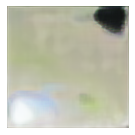

epoch: 1, loss: 0.0049, grad norm: 0.0357


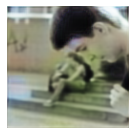

epoch: 2, loss: 0.0048, grad norm: 0.0126


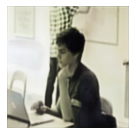

epoch: 3, loss: 0.0047, grad norm: 0.0250


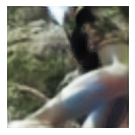

epoch: 4, loss: 0.0051, grad norm: 0.0247


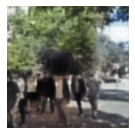

epoch: 5, loss: 0.0050, grad norm: 0.0211


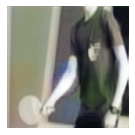

epoch: 6, loss: 0.0051, grad norm: 0.0359


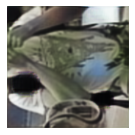

epoch: 7, loss: 0.0049, grad norm: 0.0159


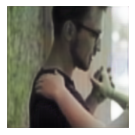

epoch: 8, loss: 0.0051, grad norm: 0.0179


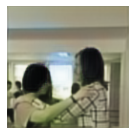

epoch: 9, loss: 0.0049, grad norm: 0.0146


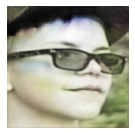

epoch: 10, loss: 0.0046, grad norm: 0.0139


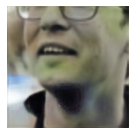

epoch: 11, loss: 0.0047, grad norm: 0.0184


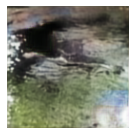

epoch: 12, loss: 0.0047, grad norm: 0.0112


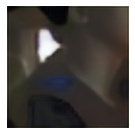

epoch: 13, loss: 0.0047, grad norm: 0.0140


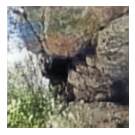

epoch: 14, loss: 0.0047, grad norm: 0.0266


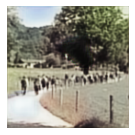

epoch: 15, loss: 0.0046, grad norm: 0.0122


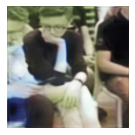

epoch: 16, loss: 0.0046, grad norm: 0.0205


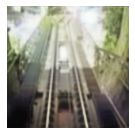

epoch: 17, loss: 0.0046, grad norm: 0.0186


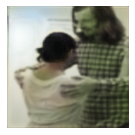

epoch: 18, loss: 0.0048, grad norm: 0.0326


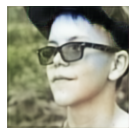

epoch: 19, loss: 0.0047, grad norm: 0.0116


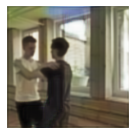

epoch: 20, loss: 0.0046, grad norm: 0.0160


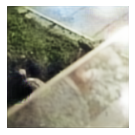

epoch: 21, loss: 0.0047, grad norm: 0.0363


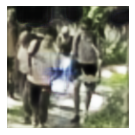

epoch: 22, loss: 0.0046, grad norm: 0.0194


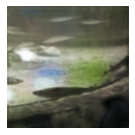

epoch: 23, loss: 0.0047, grad norm: 0.0235


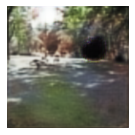

epoch: 24, loss: 0.0046, grad norm: 0.0148


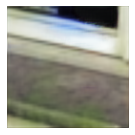

epoch: 25, loss: 0.0046, grad norm: 0.0183


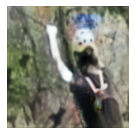

epoch: 26, loss: 0.0044, grad norm: 0.0089


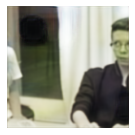

epoch: 27, loss: 0.0045, grad norm: 0.0237


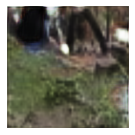

epoch: 28, loss: 0.0048, grad norm: 0.0386


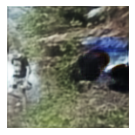

epoch: 29, loss: 0.0045, grad norm: 0.0265


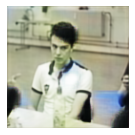

epoch: 30, loss: 0.0044, grad norm: 0.0191


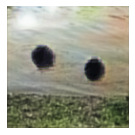

epoch: 31, loss: 0.0045, grad norm: 0.0173


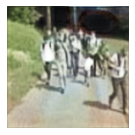

epoch: 32, loss: 0.0046, grad norm: 0.0248


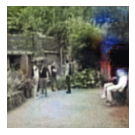

epoch: 33, loss: 0.0045, grad norm: 0.0344


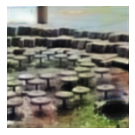

epoch: 34, loss: 0.0044, grad norm: 0.0205


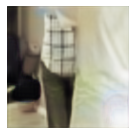

epoch: 35, loss: 0.0045, grad norm: 0.0161


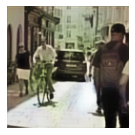

epoch: 36, loss: 0.0046, grad norm: 0.0110


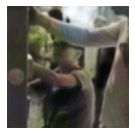

epoch: 37, loss: 0.0043, grad norm: 0.0131


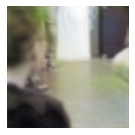

epoch: 38, loss: 0.0042, grad norm: 0.0222


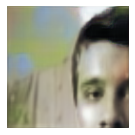

epoch: 39, loss: 0.0046, grad norm: 0.0182


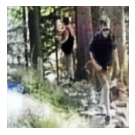

epoch: 40, loss: 0.0045, grad norm: 0.0285


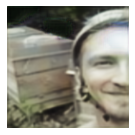

epoch: 41, loss: 0.0044, grad norm: 0.0476


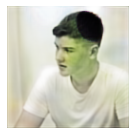

epoch: 42, loss: 0.0044, grad norm: 0.0444


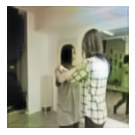

epoch: 43, loss: 0.0044, grad norm: 0.0227


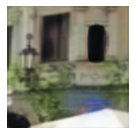

epoch: 44, loss: 0.0042, grad norm: 0.0153


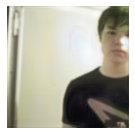

epoch: 45, loss: 0.0043, grad norm: 0.0163


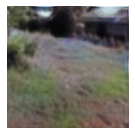

epoch: 46, loss: 0.0042, grad norm: 0.0252


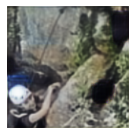

epoch: 47, loss: 0.0044, grad norm: 0.0241


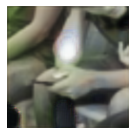

epoch: 48, loss: 0.0044, grad norm: 0.0174


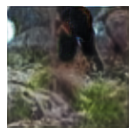

epoch: 49, loss: 0.0044, grad norm: 0.0317


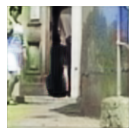

epoch: 50, loss: 0.0044, grad norm: 0.0297


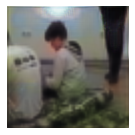

epoch: 51, loss: 0.0043, grad norm: 0.0143


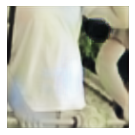

epoch: 52, loss: 0.0043, grad norm: 0.0163


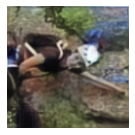

epoch: 53, loss: 0.0043, grad norm: 0.0108


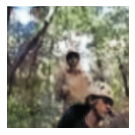

epoch: 54, loss: 0.0041, grad norm: 0.0290


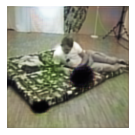

epoch: 55, loss: 0.0040, grad norm: 0.0117


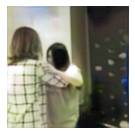

epoch: 56, loss: 0.0044, grad norm: 0.0151


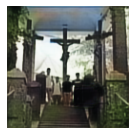

epoch: 57, loss: 0.0044, grad norm: 0.0129


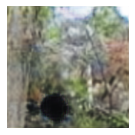

epoch: 58, loss: 0.0044, grad norm: 0.0157


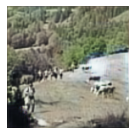

epoch: 59, loss: 0.0042, grad norm: 0.0201


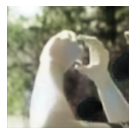

epoch: 60, loss: 0.0043, grad norm: 0.0180


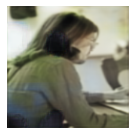

epoch: 61, loss: 0.0045, grad norm: 0.0195


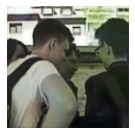

epoch: 62, loss: 0.0042, grad norm: 0.0133


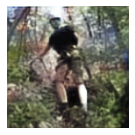

epoch: 63, loss: 0.0042, grad norm: 0.0269


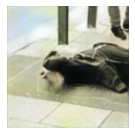

epoch: 64, loss: 0.0043, grad norm: 0.0186


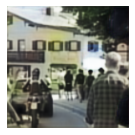

epoch: 65, loss: 0.0044, grad norm: 0.0183


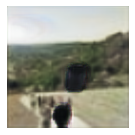

epoch: 66, loss: 0.0042, grad norm: 0.0162


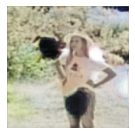

epoch: 67, loss: 0.0041, grad norm: 0.0159


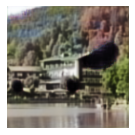

epoch: 68, loss: 0.0040, grad norm: 0.0206


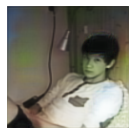

epoch: 69, loss: 0.0042, grad norm: 0.0192


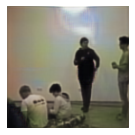

epoch: 70, loss: 0.0039, grad norm: 0.0172


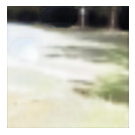

epoch: 71, loss: 0.0039, grad norm: 0.0095


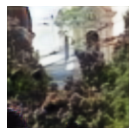

epoch: 72, loss: 0.0040, grad norm: 0.0201


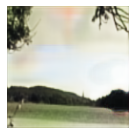

epoch: 73, loss: 0.0040, grad norm: 0.0118


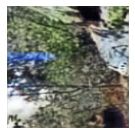

epoch: 74, loss: 0.0041, grad norm: 0.0214


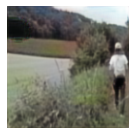

epoch: 75, loss: 0.0039, grad norm: 0.0131


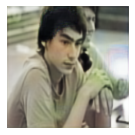

epoch: 76, loss: 0.0041, grad norm: 0.0199


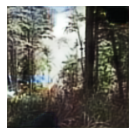

epoch: 77, loss: 0.0046, grad norm: 0.0201


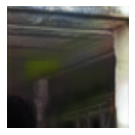

epoch: 78, loss: 0.0044, grad norm: 0.0211


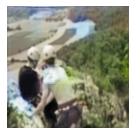

epoch: 79, loss: 0.0043, grad norm: 0.0211


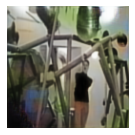

epoch: 80, loss: 0.0043, grad norm: 0.0272


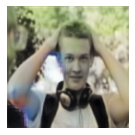

epoch: 81, loss: 0.0041, grad norm: 0.0118


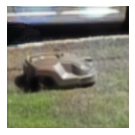

epoch: 82, loss: 0.0044, grad norm: 0.0075


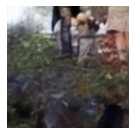

epoch: 83, loss: 0.0041, grad norm: 0.0072


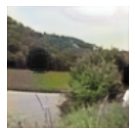

epoch: 84, loss: 0.0039, grad norm: 0.0099


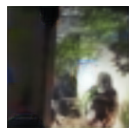

epoch: 85, loss: 0.0040, grad norm: 0.0208


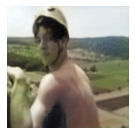

epoch: 86, loss: 0.0042, grad norm: 0.0203


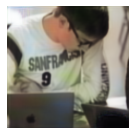

epoch: 87, loss: 0.0040, grad norm: 0.0153


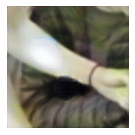

epoch: 88, loss: 0.0037, grad norm: 0.0279


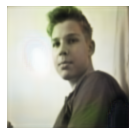

epoch: 89, loss: 0.0038, grad norm: 0.0115


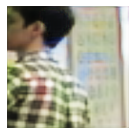

epoch: 90, loss: 0.0036, grad norm: 0.0269


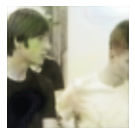

epoch: 91, loss: 0.0038, grad norm: 0.0233


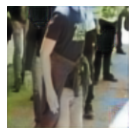

epoch: 92, loss: 0.0039, grad norm: 0.0152


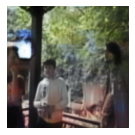

epoch: 93, loss: 0.0039, grad norm: 0.0183


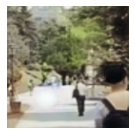

epoch: 94, loss: 0.0041, grad norm: 0.0413


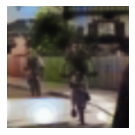

epoch: 95, loss: 0.0040, grad norm: 0.0261


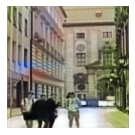

epoch: 96, loss: 0.0040, grad norm: 0.0203


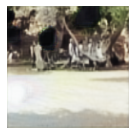

epoch: 97, loss: 0.0037, grad norm: 0.0258


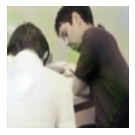

epoch: 98, loss: 0.0039, grad norm: 0.0164


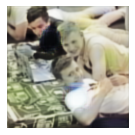

epoch: 99, loss: 0.0038, grad norm: 0.0235


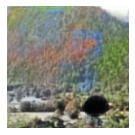

epoch: 100, loss: 0.0037, grad norm: 0.0173


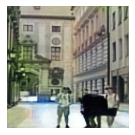

epoch: 101, loss: 0.0039, grad norm: 0.0270


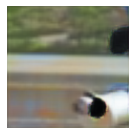

epoch: 102, loss: 0.0036, grad norm: 0.0161


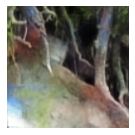

epoch: 103, loss: 0.0035, grad norm: 0.0190


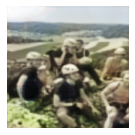

epoch: 104, loss: 0.0035, grad norm: 0.0219


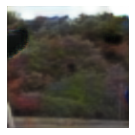

epoch: 105, loss: 0.0035, grad norm: 0.0107


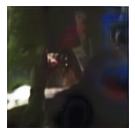

epoch: 106, loss: 0.0035, grad norm: 0.0188


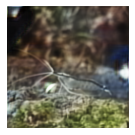

epoch: 107, loss: 0.0033, grad norm: 0.0190


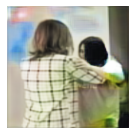

epoch: 108, loss: 0.0037, grad norm: 0.0249


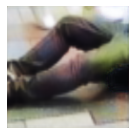

epoch: 109, loss: 0.0036, grad norm: 0.0169


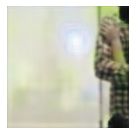

epoch: 110, loss: 0.0036, grad norm: 0.0063


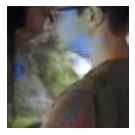

epoch: 111, loss: 0.0036, grad norm: 0.0183


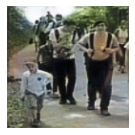

epoch: 112, loss: 0.0033, grad norm: 0.0280


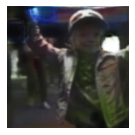

epoch: 113, loss: 0.0034, grad norm: 0.0056


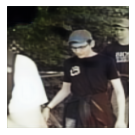

epoch: 114, loss: 0.0034, grad norm: 0.0256


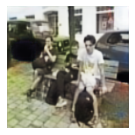

epoch: 115, loss: 0.0033, grad norm: 0.0189


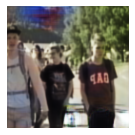

epoch: 116, loss: 0.0035, grad norm: 0.0370


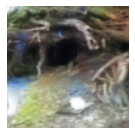

epoch: 117, loss: 0.0033, grad norm: 0.0119


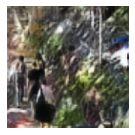

epoch: 118, loss: 0.0034, grad norm: 0.0124


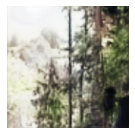

epoch: 119, loss: 0.0034, grad norm: 0.0122


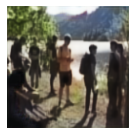

epoch: 120, loss: 0.0033, grad norm: 0.0335


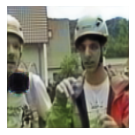

epoch: 121, loss: 0.0033, grad norm: 0.0191


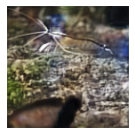

epoch: 122, loss: 0.0035, grad norm: 0.0094


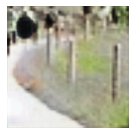

epoch: 123, loss: 0.0033, grad norm: 0.0292


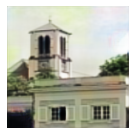

epoch: 124, loss: 0.0033, grad norm: 0.0117


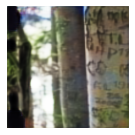

epoch: 125, loss: 0.0033, grad norm: 0.0163


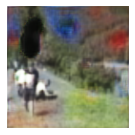

epoch: 126, loss: 0.0033, grad norm: 0.0110


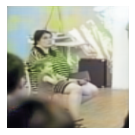

epoch: 127, loss: 0.0034, grad norm: 0.0156


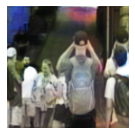

epoch: 128, loss: 0.0033, grad norm: 0.0210


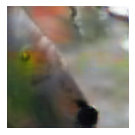

epoch: 129, loss: 0.0034, grad norm: 0.0131


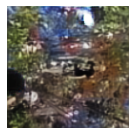

epoch: 130, loss: 0.0034, grad norm: 0.0150


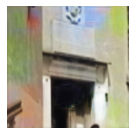

epoch: 131, loss: 0.0033, grad norm: 0.0108


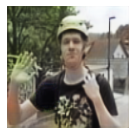

epoch: 132, loss: 0.0032, grad norm: 0.0153


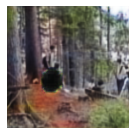

epoch: 133, loss: 0.0032, grad norm: 0.0177


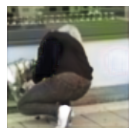

epoch: 134, loss: 0.0032, grad norm: 0.0138


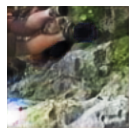

epoch: 135, loss: 0.0032, grad norm: 0.0181


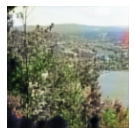

epoch: 136, loss: 0.0032, grad norm: 0.0224


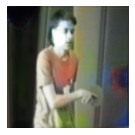

epoch: 137, loss: 0.0032, grad norm: 0.0150


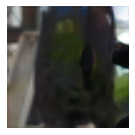

epoch: 138, loss: 0.0033, grad norm: 0.0225


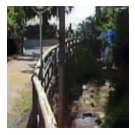

epoch: 139, loss: 0.0035, grad norm: 0.0149


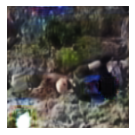

epoch: 140, loss: 0.0031, grad norm: 0.0135


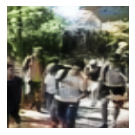

epoch: 141, loss: 0.0031, grad norm: 0.0137


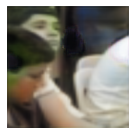

epoch: 142, loss: 0.0031, grad norm: 0.0297


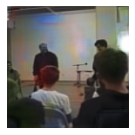

epoch: 143, loss: 0.0031, grad norm: 0.0174


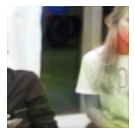

epoch: 144, loss: 0.0031, grad norm: 0.0168


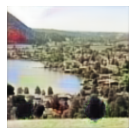

epoch: 145, loss: 0.0036, grad norm: 0.0176


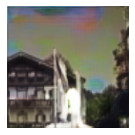

epoch: 146, loss: 0.0034, grad norm: 0.0234


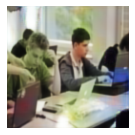

epoch: 147, loss: 0.0034, grad norm: 0.0178


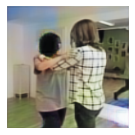

epoch: 148, loss: 0.0033, grad norm: 0.0113


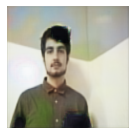

epoch: 149, loss: 0.0032, grad norm: 0.0292


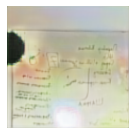

In [ ]:
history = []
for epoch in range(num_epochs):
    train_loss = 0
    for x, y in loader:
      x = x.to(device)
      y = y.to(device)
      optimizer.zero_grad()

      output = model(x)
      loss = criterion(output, y)
      loss.backward()
      history.append(loss.item())
      train_loss += loss.item()

      optimizer.step()
    grad_norm = clip_grad_norm_(model.parameters(), 500)
    print('epoch: %d, loss: %.4f, grad norm: %.4f' % (epoch, train_loss / len(loader), grad_norm))
    image_index = np.random.randint(0, len(dataset))
    gray_image = dataset[image_index][0].to(device).view(1, 1, 128, 128)
    with torch.no_grad():
      image = model(gray_image)
      plot_image(image)
        # теперь сами:
        # 0. распакавать данные на нужное устройство
        # 1. сбросить градиент
        # 2. прогнать данные через сеть
        # 3. посчитать loss
        # 4. залоггировать его куда-нибудь
        # 5. сделать .backward()
        # 6. optimizer.step()
        # (7. вывести пример колоризации -- см код ниже)

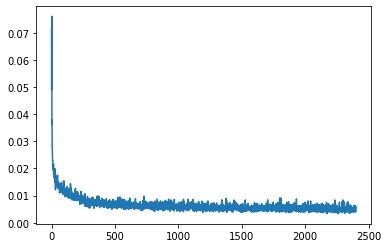

In [ ]:
# Построим график значений лосса
plt.plot(history)

In [ ]:
# сохраним модель
torch.save({
            'epoch': epoch,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'loss': loss,
            }, 'model.pth')

В подобных нечётко поставленных задачах важно смотреть не цифры, а на реальные примеры.


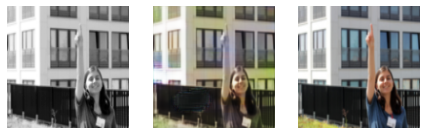

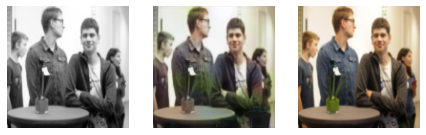

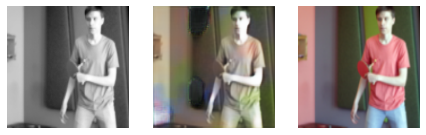

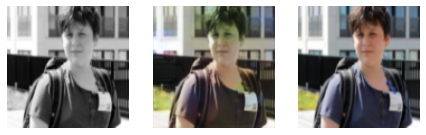

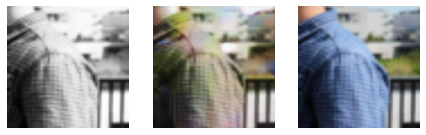

...

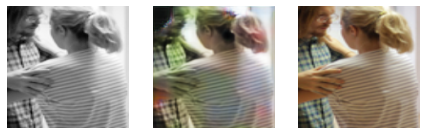

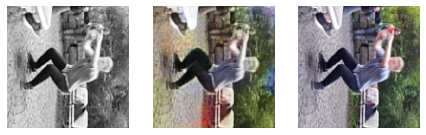

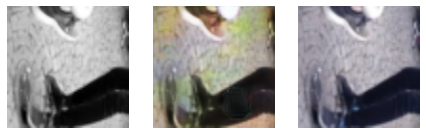

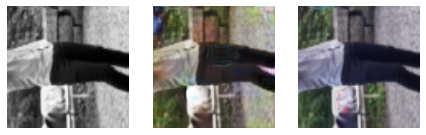

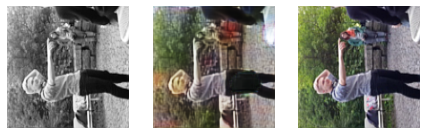

In [ ]:
for t in range(50):
    img_gray, img_true = dataset[t]
    img_pred = model(img_gray.to(device).view(1, 1, 128, 128))
    img_pred = to_numpy_image(img_pred)
    # теперь это numpy-евский ndarray размера (128, 128, 3)
    plt.figure(figsize=(10,10))
    
    plt.subplot(141)
    plt.axis('off')
    plt.set_cmap('Greys')
    plt.imshow(img_gray.cpu().reshape((128, 128)))

    plt.subplot(142)
    plt.axis('off')
    plt.imshow(img_pred.reshape((128, 128, 3)))

    plt.subplot(143)
    plt.axis('off')
    plt.imshow(to_numpy_image(img_true))
    
    plt.show()

## *Тизер: adversarial loss

У нашего подхода к колоризации есть одна весьма существенная проблема: непонятно, как определять функцию потерь. Выясняется, что l1 или l2 в некоторых случаях даже являются принципиально неправильным выбором. Представьте, что у нас есть датасет фотографий с летнего лагеря, в котором все люди ходят в футболках двух разных цветов — например, красного и синего — интенсивность которых одинакова и неотличима на черно-белых версиях. Тогда наш лосс заставит сеть выбирать что-то «по середине» (в случае с l2 это будет среднее, а с l1 медиана), и, скорее всего, она сгенерирует что-то серое, в то время как она должна с какой-то вероятностью сгенерировать явно красную или явно синюю футболку.

Решение в следующем: выход (колоризованное изображение) кормить в другую сеть, которая учится определять «правдоподобность» раскраски. Помимо восстановления изображения с точки зрения какой-то меры близости, сети-генератору (колоризатору) нужно ещё и обмануть сеть-дискриминатор, а сети-дискриминатору нужно наоборот, учиться отличать настоящую колоризацию от нашей.

Подобные схемы с двумя состязяющимися сетями называют GAN-ам (Generative Adversarial Networks), о которых мы поговорим через занятие.